In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

working_dir = '/content/gdrive/MyDrive/Object_detection'

import os
os.makedirs(working_dir, exist_ok=True)

%cd {working_dir}

Mounted at /content/gdrive
/content/gdrive/MyDrive/Object_detection


In [3]:
# !git clone https://github.com/ultralytics/yolov5  # clone

%cd yolov5
%pip install -r requirements.txt  # install

# !git clone https://github.com/nwojke/deep_sort.git
# !wget https://github.com/anushkadhiman/ObjectTracking-DeepSORT-YOLOv3-TF2/raw/master/model_data/coco/mars-small128.pb

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.1/78.2 GB disk)


# Traffic Sign

## GTSRB

### Data preparation

In [ ]:
import os
import shutil
import pandas as pd

os_dir = "/home/soumya/dataset/GTSRB"

for dir in os.listdir(os_dir):
    if dir == '.DS_Store' :
        continue
    inner_dir = os.path.join(os_dir, dir)
    # print(inner_dir[-5:])
    for img in os.listdir(inner_dir):
        if img == "GT-" + dir + '.csv':
            csv_file = pd.read_csv(os.path.join(inner_dir,"GT-" + dir + '.csv'), sep=';')
            csv_file['Filename'] = csv_file['Filename'].apply(lambda x: f'{inner_dir[-5:]}_{x}')
            csv_file.to_csv(f'{inner_dir}/GGT-{dir}.csv', sep=';',index = False)
        else:
            os.rename(inner_dir + '/' + img, inner_dir + '/' + f'{inner_dir[-5:]}_{img}')

for dir in os.listdir(os_dir):
    if dir == '.DS_Store':
        continue
    inner_dir = os.path.join(os_dir, dir)
    print(inner_dir)
    for img in os.listdir(inner_dir):
        if img == "GT-" + dir + '.csv' or img == "GGT-" + dir + '.csv' or img == '00000_GT-00000.gsheet': # omit all files except the images
            continue

        else:
            shutil.copy(f'{inner_dir}/{img}',"/home/soumya/dataset/images")

/home/soumya/dataset/GTSRB/00014

/home/soumya/dataset/GTSRB/00010

/home/soumya/dataset/GTSRB/00004

/home/soumya/dataset/GTSRB/00005

/home/soumya/dataset/GTSRB/00019

/home/soumya/dataset/GTSRB/00030

/home/soumya/dataset/GTSRB/00039

/home/soumya/dataset/GTSRB/00020

/home/soumya/dataset/GTSRB/00003

/home/soumya/dataset/GTSRB/00026

/home/soumya/dataset/GTSRB/00013

/home/soumya/dataset/GTSRB/00008

/home/soumya/dataset/GTSRB/00042

/home/soumya/dataset/GTSRB/00036

/home/soumya/dataset/GTSRB/00022

/home/soumya/dataset/GTSRB/00041

/home/soumya/dataset/GTSRB/00029

/home/soumya/dataset/GTSRB/00034

/home/soumya/dataset/GTSRB/00002

/home/soumya/dataset/GTSRB/00021

/home/soumya/dataset/GTSRB/00000

/home/soumya/dataset/GTSRB/00027

/home/soumya/dataset/GTSRB/00009

/home/soumya/dataset/GTSRB/00015

/home/soumya/dataset/GTSRB/00038

/home/soumya/dataset/GTSRB/00031

/home/soumya/dataset/GTSRB/00035

/home/soumya/dataset/GTSRB/00028

/home/soumya/dataset/GTSRB/00032

/home/soumya/d

In [ ]:
image_csv = pd.DataFrame()
for dir in os.listdir(os_dir):
    if dir == '.DS_Store' :
        continue
    inner_dir = os.path.join(os_dir, dir)
    csv_file = pd.read_csv(os.path.join(inner_dir, inner_dir[-5:] + "_" +"GGT-" + dir + '.csv'), sep=';')

    image_csv = image_csv.append(csv_file)
print(image_csv.shape)

(26640, 8)


In [ ]:
%cd /home/soumya/dataset/labels

def compare(v1, v2):
    if v1 > v2:
        vmax, vmin = v1, v2
        return vmax, vmin
    else:
        vmax, vmin = v2, v1
        return vmax, vmin
def convert_labels(z):
    x1 = z['Roi.X1']
    y1 = z['Roi.Y1']
    x2 = z['Roi.X2']
    y2 = z['Roi.Y2']
    size = [z['Height'],z['Width']]
    xmax, xmin = compare(x1, x2)
    ymax, ymin = compare(y1, y2)
    dw = 1./size[1]
    dh = 1./size[0]
    x = (xmin + xmax)/2.0
    y = (ymin + ymax)/2.0
    w = xmax - xmin
    h = ymax - ymin
    x = x*dw
    w = w*dw
    y = y*dh
    h = h*dh
    return x,y,w,h

for index, x in image_csv.iterrows():
    name = x['Filename'].replace('.ppm','.txt')
    labels = convert_labels(x)
    cls = x['ClassId']
    f = open(f'{name}','w+')
    f.write(f'{cls} {labels[0]} {labels[1]} {labels[2]} {labels[3]}')
    f.close()

/home/soumya/dataset/labels


In [ ]:
!pwd

/home/soumya/dataset/labels


In [ ]:
%cd /home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign

/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign


### Data Spliting

In [ ]:
y = image_csv['ClassId']

from sklearn.model_selection import train_test_split
train_ds, valid_ds = train_test_split(image_csv,
                                      test_size = 0.3,
                                      random_state = 43,
                                      shuffle = True,
                                      stratify = y)

train_ds.reset_index()
valid_ds.reset_index()

f = open(f'train.txt','w+')
for index, x in train_ds.iterrows():
    name = x['Filename']
    f.write(f'{name}\n')
f.close()

f = open(f'val.txt','w+')
for index, x in valid_ds.iterrows():
    name = x['Filename']
    f.write(f'{name}\n')
f.close()

In [ ]:
f = open(f'train.txt','r+')
img_train = []
for i in f:
    img_train.append(i[:-1])
print(len(img_train[:-1]))

f = open(f'val.txt','r+')
img_val = []
for i in f:
    img_val.append(i[:-1])
print(len(img_val[:-1]))

18647

7991


In [ ]:
from_image_dir = "/home/soumya/dataset/images"
from_label_dir = "/home/soumya/dataset/labels"

for img in os.listdir("/home/soumya/dataset/images"):
    if img in img_train:
        shutil.copy(f'{from_image_dir}/{img}',"/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/images/train")
        img = img.replace('.ppm','.txt')
        shutil.copy(f'{from_label_dir}/{img}',"/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/labels/train")

    if img in img_val:
        shutil.copy(f'{from_image_dir}/{img}',"/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/images/val")
        img = img.replace('.ppm','.txt')
        shutil.copy(f'{from_label_dir}/{img}',"/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/labels/val")

In [ ]:
from PIL import Image
import time
import glob

im_dir = '/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/images/train'
%cd {im_dir}
im_list = glob.glob('*.ppm')
for i, im in enumerate(im_list):
    name = im[:-4]
    im_file = Image.open(im)
    im_file.save(f'{name}.jpg')
    time.sleep(0.01)
    os.remove(im)
    if not i % 100:
        print(i)
else:
    print(i)
    print('done')

/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/images/train

0

100

200

300

400

500

600

700

800

900

1000

1100

1200

1300

1400

1500

1600

1700

1800

1900

2000

2100

2200

2300

2400

2500

2600

2700

2800

2900

3000

3100

3200

3300

3400

3500

3600

3700

3800

3900

4000

4100

4200

4300

4400

4500

4600

4700

4800

4900

5000

5100

5200

5300

5400

5500

5600

5700

5800

5900

6000

6100

6200

6300

6400

6500

6600

6700

6800

6900

7000

7100

7200

7300

7400

7500

7600

7700

7800

7900

8000

8100

8200

8300

8400

8500

8600

8700

8800

8900

9000

9100

9200

9300

9400

9500

9600

9700

9800

9900

10000

10100

10200

10300

10400

10500

10600

10700

10800

10900

11000

11100

11200

11300

11400

11500

11600

11700

11800

11900

12000

12100

12200

12300

12400

12500

12600

12700

12800

12900

13000

13100

13200

13300

13400

13500

13600

13700

13800

13900

14000

14100

14200

14300

14400

14500

14600

14

In [ ]:
a = glob.glob('*.jpg')
len(a)

18648

In [ ]:
lb_dir = '/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/labels/train'
%cd {lb_dir}
a = glob.glob('*.txt')
len(a)

/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/labels/train


18648

In [ ]:
im_dir = '/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/images/val'
%cd {im_dir}
im_list = glob.glob('*.ppm')
for i, im in enumerate(im_list):
    name = im[:-4]
    im_file = Image.open(im)
    im_file.save(f'{name}.jpg')
    time.sleep(0.01)
    os.remove(im)
    if not i % 100:
        print(i)
else:
    print(i)
    print('done')

/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/images/val

0

100

200

300

400

500

600

700

800

900

1000

1100

1200

1300

1400

1500

1600

1700

1800

1900

2000

2100

2200

2300

2400

2500

2600

2700

2800

2900

3000

3100

3200

3300

3400

3500

3600

3700

3800

3900

4000

4100

4200

4300

4400

4500

4600

4700

4800

4900

5000

5100

5200

5300

5400

5500

5600

5700

5800

5900

6000

6100

6200

6300

6400

6500

6600

6700

6800

6900

7000

7100

7200

7300

7400

7500

7600

7700

7800

7900

7991

done


In [ ]:
a = glob.glob('*.jpg')
len(a)

7992

In [ ]:
lb_dir = '/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/labels/val'
%cd {lb_dir}
a = glob.glob('*.txt')
len(a)

/home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/labels/val


7992

### Training

In [ ]:
%cd /home/soumya/Self-Driving-Car/Object_detection/yolov5

/home/soumya/Self-Driving-Car/Object_detection/yolov5


In [ ]:
!python train.py --img 640 --batch 16 --epochs 25 --data traffic.yaml --weights yolov5s.pt --cache --name Trafficsign_training

### Detection

In [ ]:
!python detect.py --weights "" --img 640 --conf 0.25 --source /home/soumya/Self-Driving-Car/Object_detection/dataset_trafficsign/trafficsign.jpg --name Vehicle_detection

## TT100K

### LoadData

In [ ]:
%cd /content/gdrive/MyDrive/Object_detection/TT100K

/content/gdrive/MyDrive/Object_detection


In [ ]:
from google.colab import files
files.upload() #upload your kaggle.json file

!mkdir ~/.kaggle #create a directory called .kaggle in the root folder
!cp kaggle.json ~/.kaggle/ #copy kaggle.json to this folder
!chmod 600 ~/.kaggle/kaggle.json #add full rights to this copied file

!rm kaggle.json #remove the original one

# !kaggle datasets download -d braunge/tt100k

!kaggle datasets download -d lweize/tt100k-yolo

Saving kaggle.json to kaggle.json
100% 8.45G/8.46G [01:43<00:00, 49.2MB/s]
100% 8.46G/8.46G [01:43<00:00, 87.4MB/s]


In [ ]:
!unzip tt100k-yolo.zip
!rm tt100k-yolo.zip

Streaming output truncated to the last 5000 lines.
  inflating: labels/train/60704.txt  
  inflating: labels/train/60710.txt  
  inflating: labels/train/60746.txt  
  inflating: labels/train/60748.txt  
  inflating: labels/train/60789.txt  
  inflating: labels/train/6081.txt   
  inflating: labels/train/60811.txt  
  inflating: labels/train/60850.txt  
  inflating: labels/train/60876.txt  
  inflating: labels/train/60884.txt  
  inflating: labels/train/60917.txt  
  inflating: labels/train/60943.txt  
  inflating: labels/train/60955.txt  
  inflating: labels/train/61011.txt  
  inflating: labels/train/61040.txt  
  inflating: labels/train/61125.txt  
  inflating: labels/train/61130.txt  
  inflating: labels/train/61131.txt  
  inflating: labels/train/61152.txt  
  inflating: labels/train/61157.txt  
  inflating: labels/train/61173.txt  
  inflating: labels/train/61186.txt  
  inflating: labels/train/61216.txt  
  inflating: labels/train/61221.txt  
  inflating: labels/train/61229.txt  

### Training

In [ ]:
%%writefile trafficsign.yaml

train: /content/gdrive/MyDrive/Object_detection/TT100K/images/train
val: /content/gdrive/MyDrive/Object_detection/TT100K/images/val
test:  # test images (optional)

nc: 50

names: ['pl80', 'p6', 'ph', 'w', 'pa', 'p27', 'i5', 'p1', 'il70', 'p5', 'pm', 'p19', 'ip', 'p11', 'p13', 'p26', 'i2', 'pn', 'p10', 'p23', 'pbp', 'p3', 'p12',
          'pne', 'i4', 'pb', 'pg', 'pr','pl5','pl10', 'pl15','pl20','pl25','pl30','pl35','pl40','pl50','pl60','pl65','pl70','pl90','pl100','pl110',
          'pl120','il50','il60','il80','il90','il100','il110']

Writing trafficsign.yaml


In [ ]:
# !rm -rf runs/train/Trafficsign_training

In [ ]:
!python train.py --batch 32 --data trafficsign.yaml --weights yolov5s.pt --name Trafficsign_training

train: weights=yolov5s.pt, cfg=, data=trafficsign.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=Trafficsign_training, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015,

In [ ]:
!python train.py --resume /kaggle/working/yolov5/runs/train/Trafficsign_training/weights/last.pt

In [ ]:
!python train.py --img 640 --batch 32 --epochs 200 --data trafficsign.yaml --weights your_model.pt --cache --exist-ok

### Results

#### Class Distribution

In [ ]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Trafficsign_training/labels_correlogram.jpg'));

In [ ]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Trafficsign_training/labels.jpg'));

#### Batch Image

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/Trafficsign_training/train_batch0.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/Trafficsign_training/train_batch1.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/Trafficsign_training/train_batch2.jpg'))

#### GT Vs Pred

In [ ]:
fig, ax = plt.subplots(3, 2, figsize = (2*5,3*5), constrained_layout = True)
for row in range(3):
    ax[row][0].imshow(plt.imread(f'runs/train/Trafficsign_training/val_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'runs/train/Trafficsign_training/val_batch{row}_labels.jpg', fontsize = 12)

    ax[row][1].imshow(plt.imread(f'runs/train/Trafficsign_training/val_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'runs/train/Trafficsign_training/val_batch{row}_pred.jpg', fontsize = 12)

#### (Loss, Map) Vs Epoch

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Trafficsign_training/results.png'));

#### Confusion Matrix

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Trafficsign_training/confusion_matrix.png'));

#### Metrics

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Trafficsign_training/F1_curve.png'));

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Trafficsign_training/P_curve.png'));

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Trafficsign_training/R_curve.png'));

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Trafficsign_training/PR_curve.png'));

### Detection

In [ ]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source /content/gdrive/MyDrive/Object_detection/yolov5/data/videos/detection.mp4 --name TrafficSign_detection

# Vehicle

## Training

In [4]:
%%writefile vehicle.yaml

path: /content/gdrive/MyDrive/Object_detection/dataset_vehicles
train: images/train
val: images/val
test:

# Classes
nc: 5
names: [ 'Car', 'Motorcycle', 'Truck', 'Bus', 'Bicycle']  # class names

Writing vehicle.yaml


In [5]:
!python train.py --img 640 --batch 16 --epochs 100 --data vehicle.yaml --weights yolov5s.pt --cache --name Vehicle_training

train: weights=yolov5s.pt, cfg=, data=vehicle.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=Vehicle_training, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.

## Results

In [7]:
import matplotlib.pyplot as plt

### Class Distribution

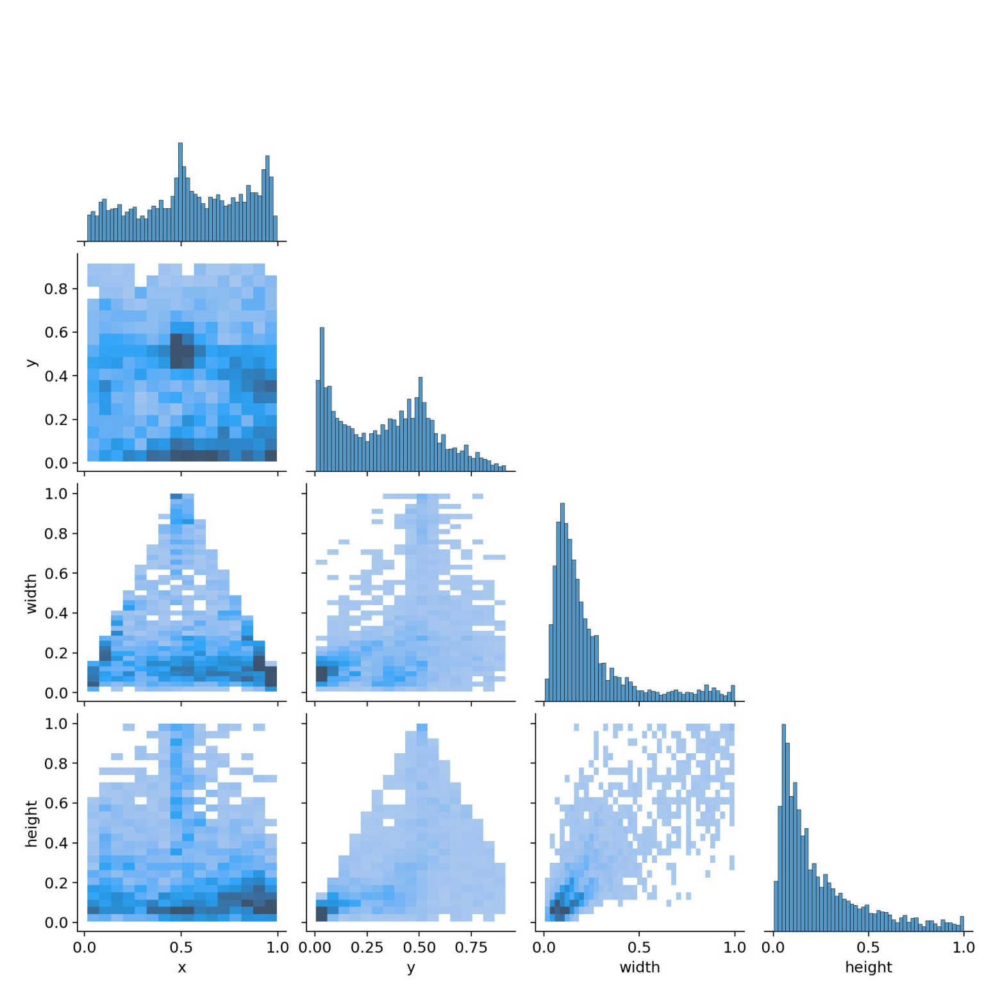

In [8]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Vehicle_training/labels_correlogram.jpg'));

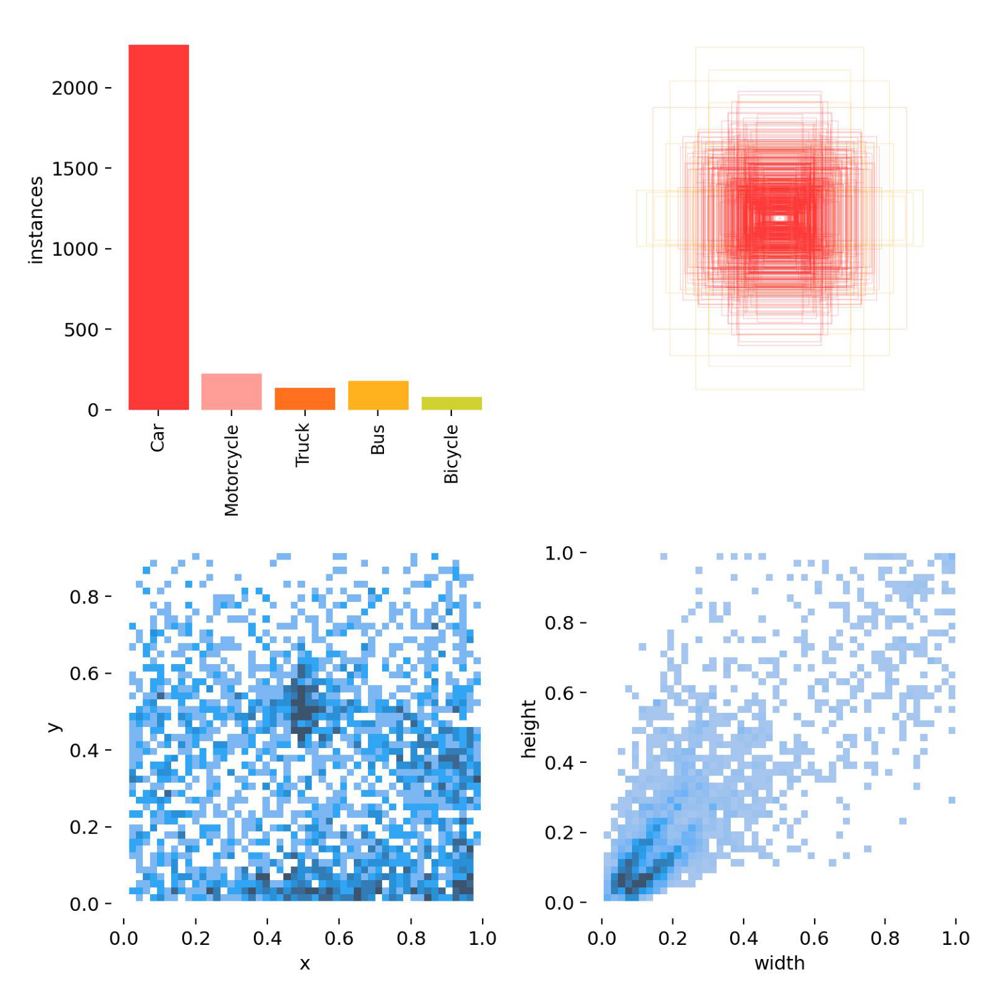

In [9]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Vehicle_training/labels.jpg'));

### Batch Image

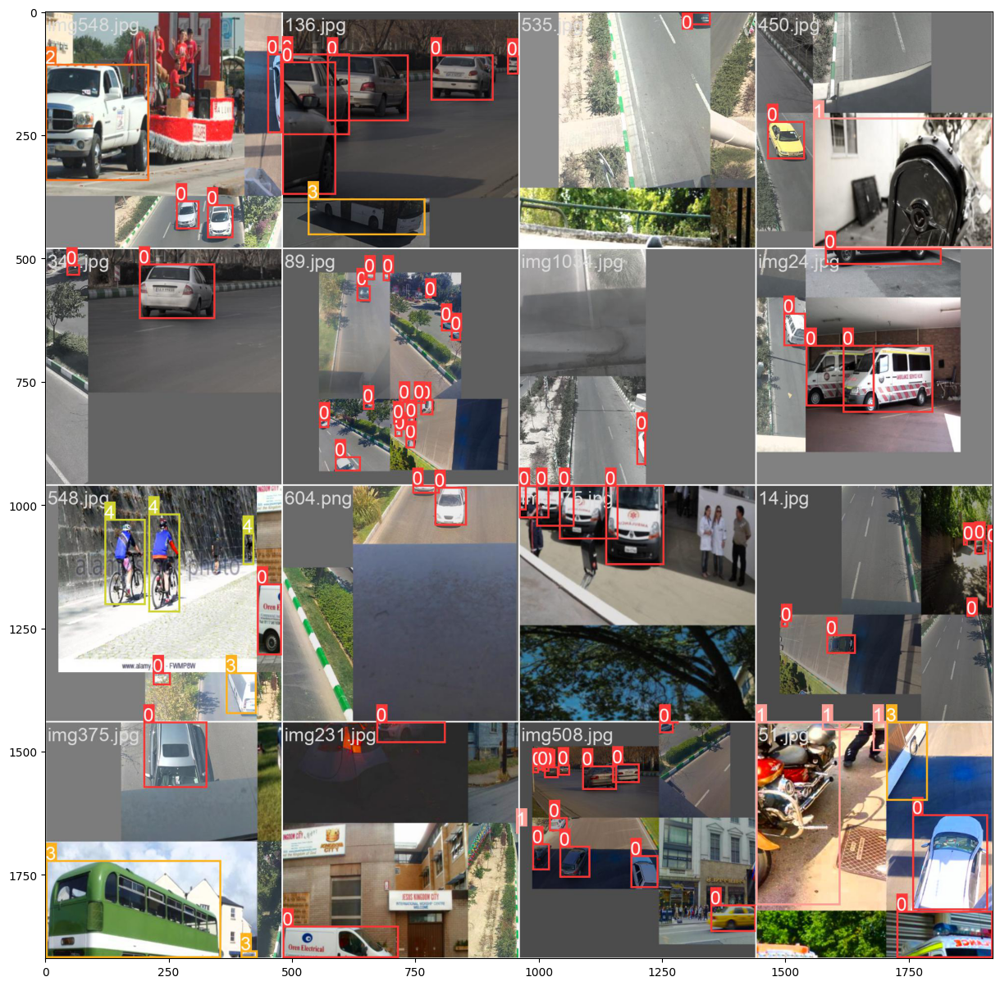

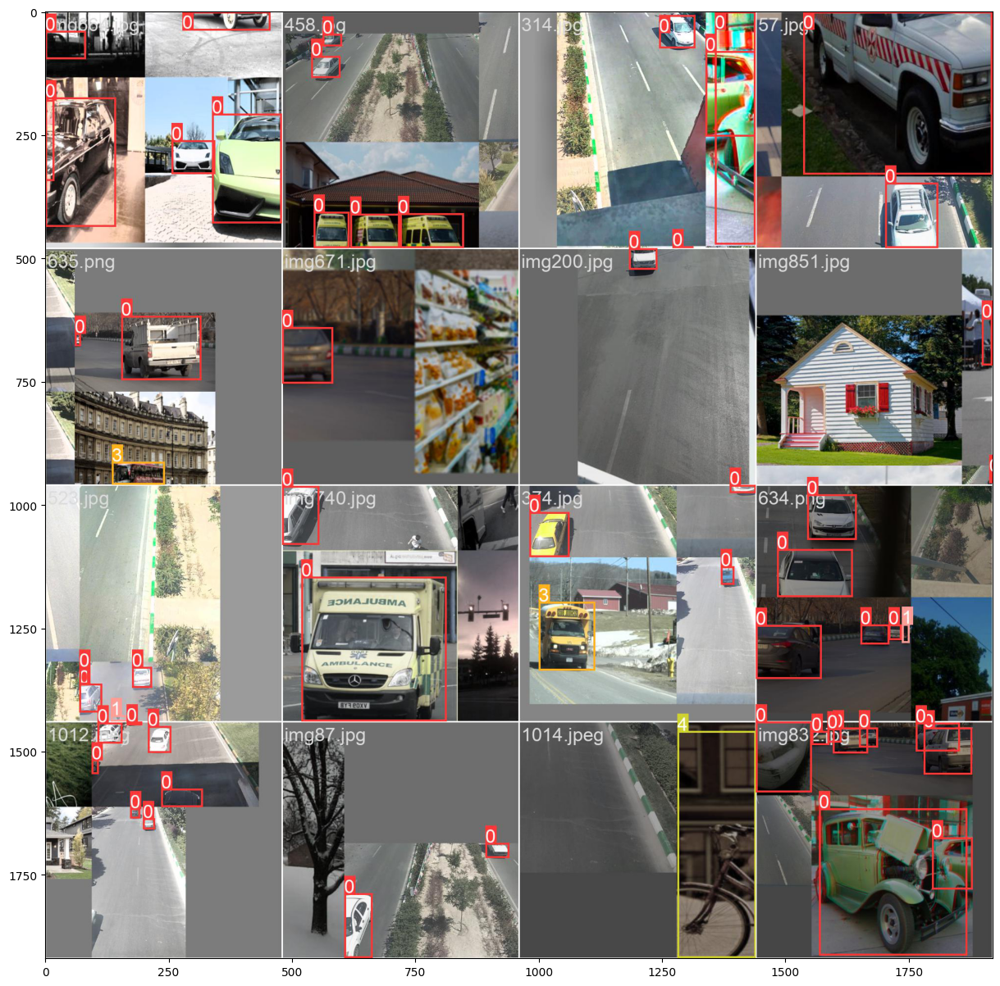

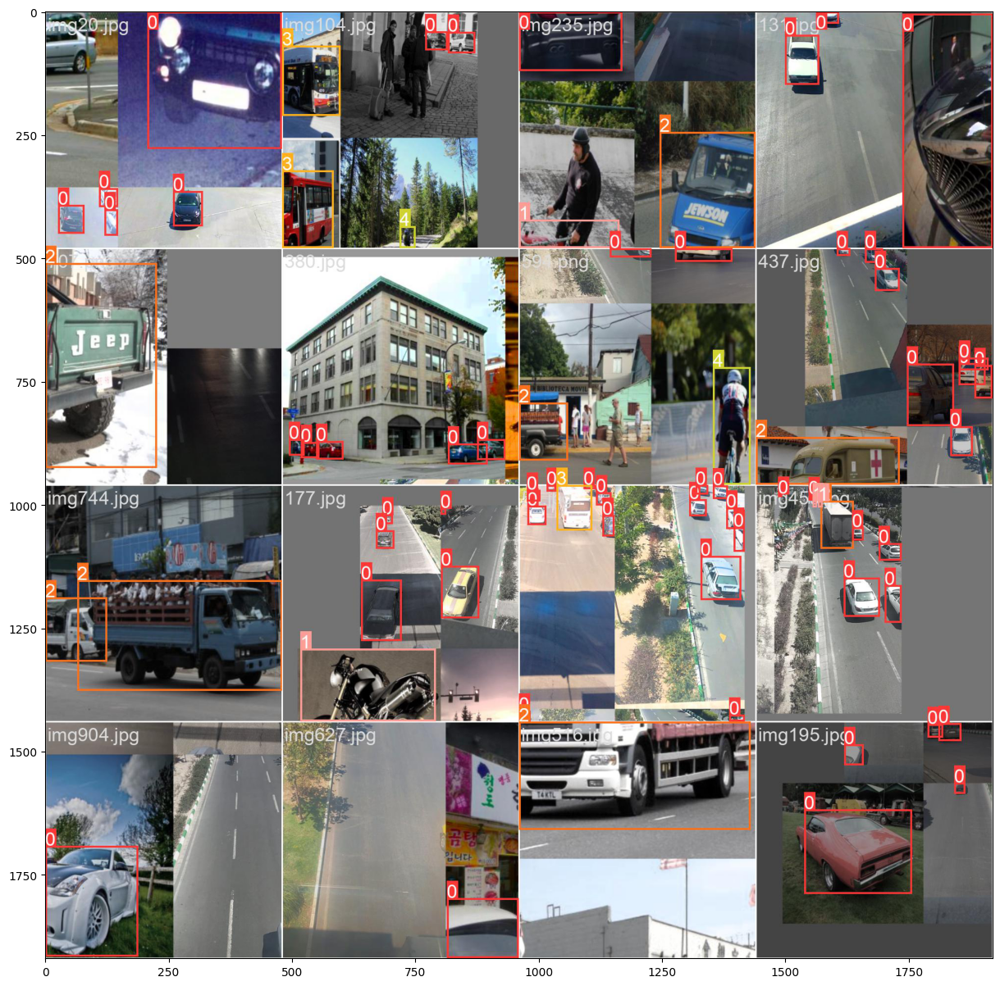

In [10]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/Vehicle_training/train_batch0.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/Vehicle_training/train_batch1.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/Vehicle_training/train_batch2.jpg'))

### GT Vs Pred

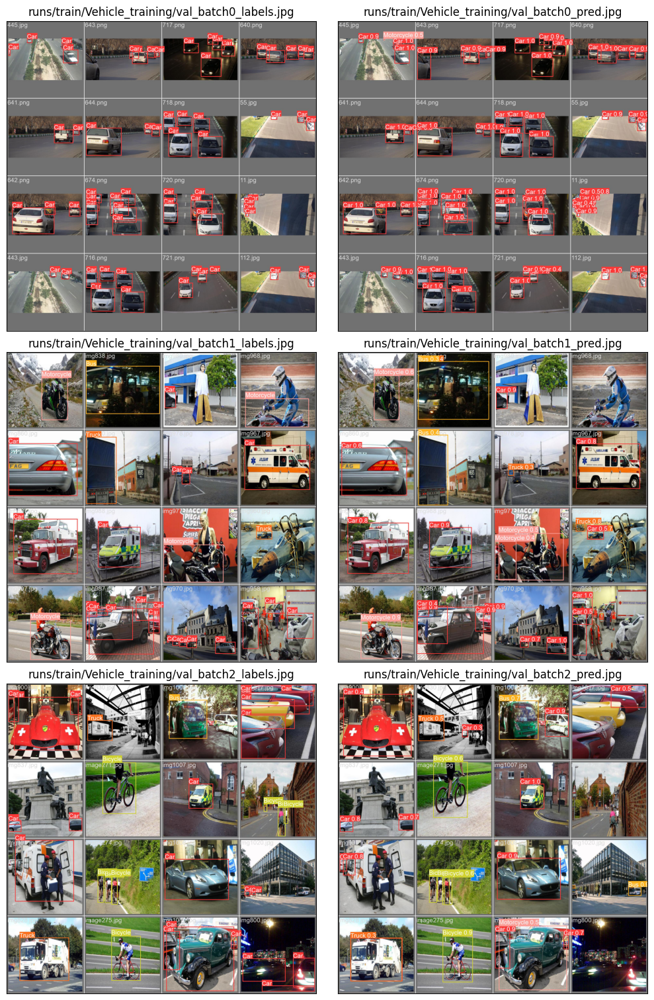

In [11]:
fig, ax = plt.subplots(3, 2, figsize = (2*5,3*5), constrained_layout = True)
for row in range(3):
    ax[row][0].imshow(plt.imread(f'runs/train/Vehicle_training/val_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'runs/train/Vehicle_training/val_batch{row}_labels.jpg', fontsize = 12)

    ax[row][1].imshow(plt.imread(f'runs/train/Vehicle_training/val_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'runs/train/Vehicle_training/val_batch{row}_pred.jpg', fontsize = 12)

### (Loss, Map) Vs Epoch

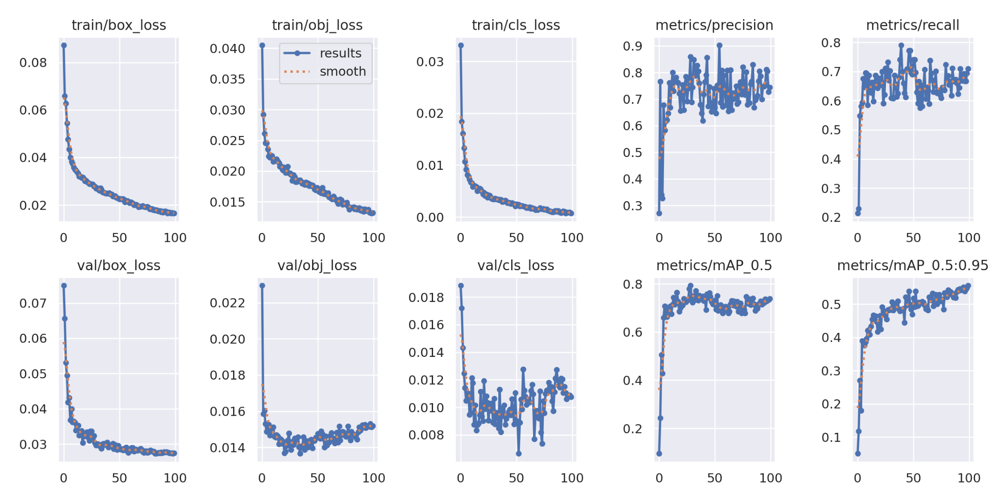

In [12]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Vehicle_training/results.png'));

### Confusion Matrix

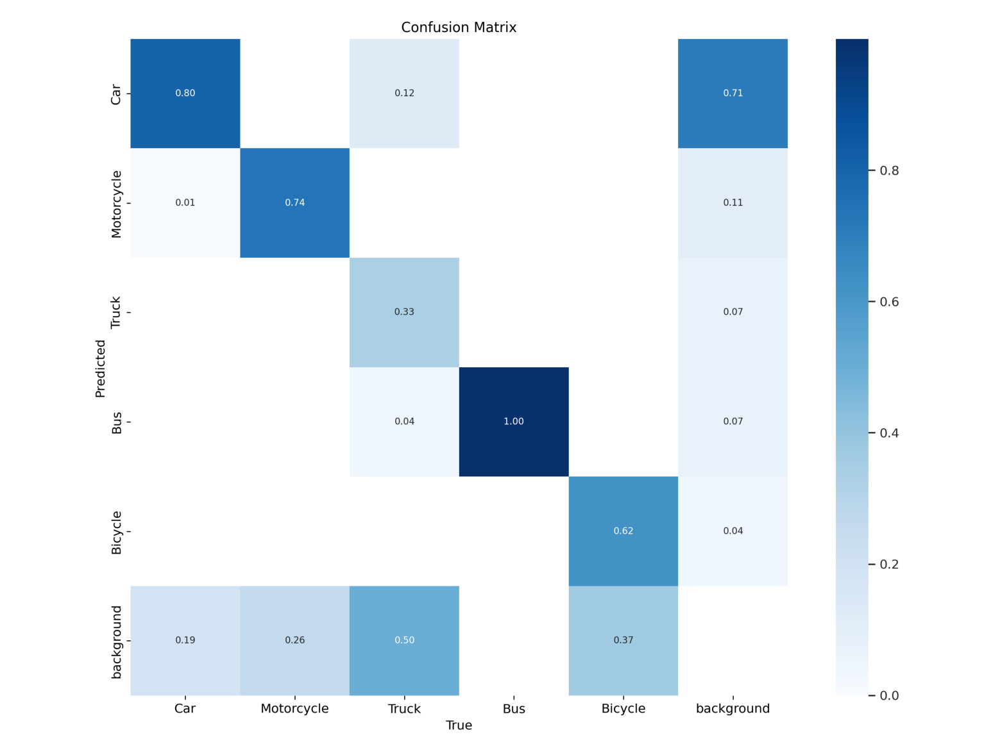

In [13]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Vehicle_training/confusion_matrix.png'));

### Metrics

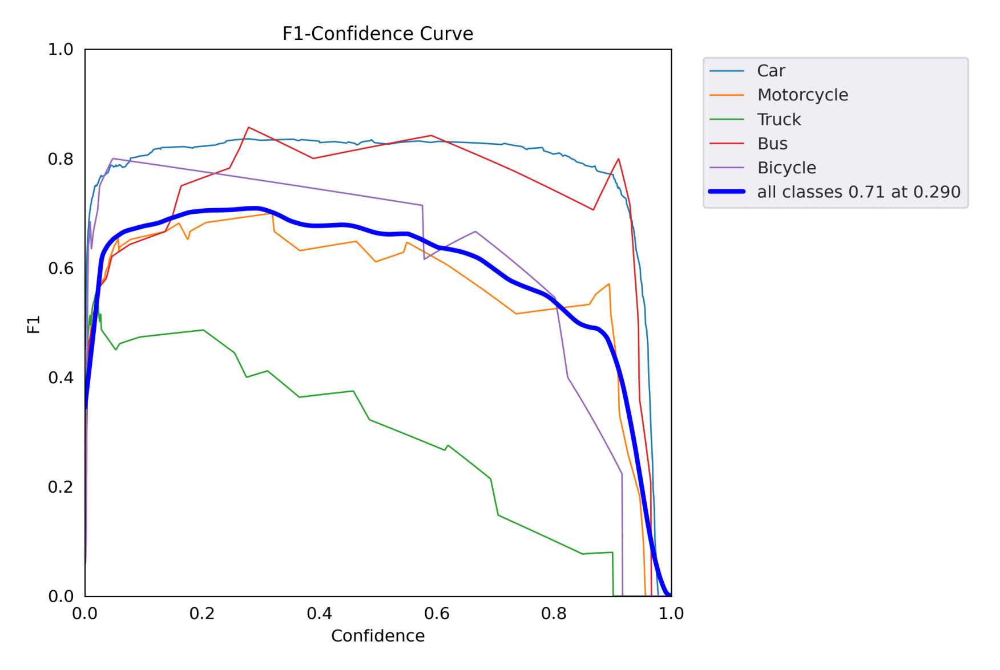

In [14]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Vehicle_training/F1_curve.png'));

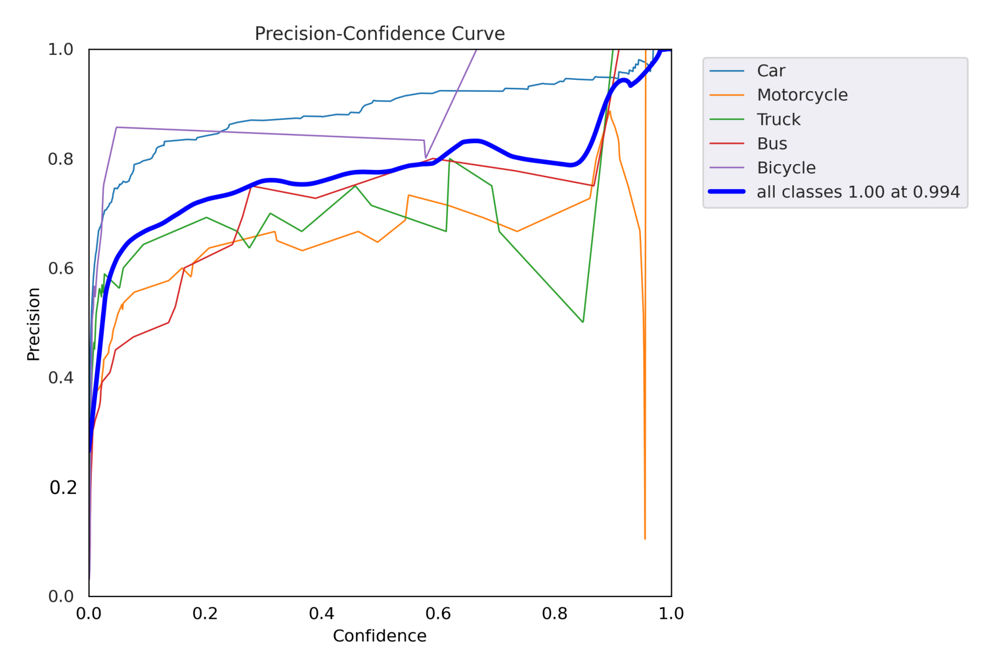

In [15]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Vehicle_training/P_curve.png'));

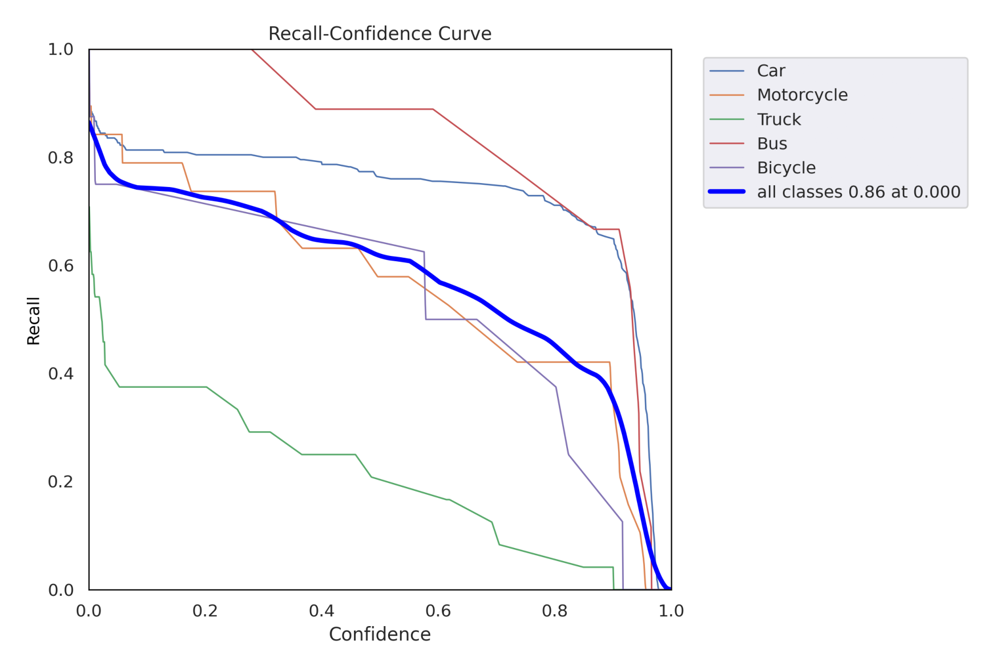

In [16]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Vehicle_training/R_curve.png'));

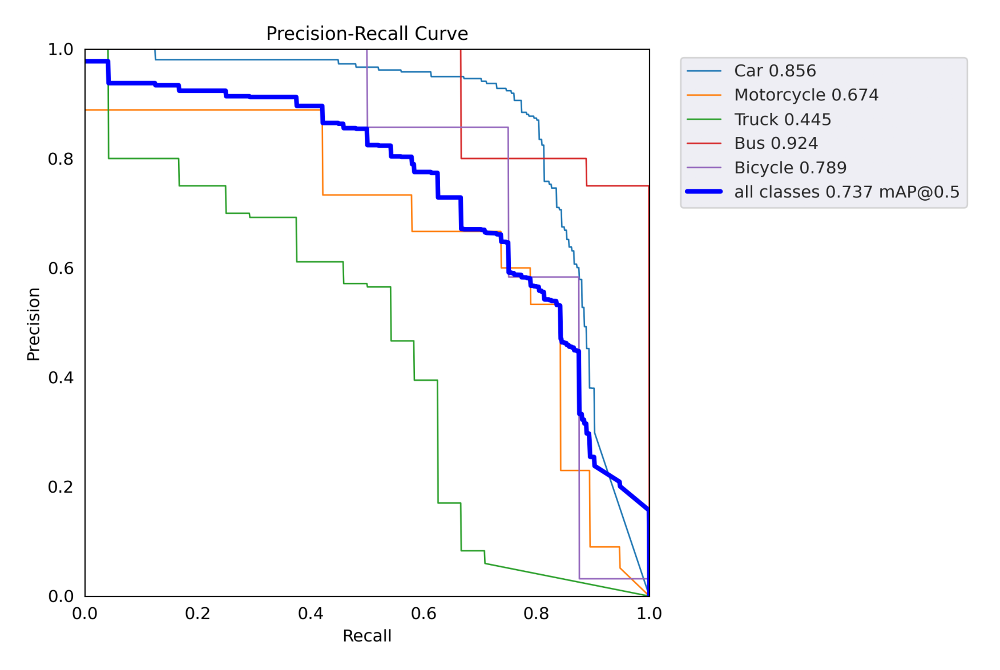

In [17]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/Vehicle_training/PR_curve.png'));

## Detection

In [18]:
!python detect.py --weights /content/gdrive/MyDrive/Object_detection/yolov5/runs/train/Vehicle_training/weights/best.pt --img 640 --conf 0.25 --source /content/gdrive/MyDrive/Object_detection/yolov5/data/videos/test_video.mp4 --name Vehicle_detection

detect: weights=['/content/gdrive/MyDrive/Object_detection/yolov5/runs/train/Vehicle_training/weights/best.pt'], source=/content/gdrive/MyDrive/Object_detection/yolov5/data/videos/test_video.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=Vehicle_detection, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-185-g2334aa7 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/38) /content/gdrive/MyDrive/Object_detection/yolov5/data/videos/test_video.mp4: 384x640 2 Cars, 69.5ms
video 1/1 (2/38) /content/gdrive/MyDrive/Object_detection/yolov5/data/videos/test_video.mp4: 384x640

In [3]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('/home/soumya/Self-Driving-Car/Object_detection/yolov5/runs/detect/Vehicle_detection/test_video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""<video width=400 controls>
        <source src="%s" type="video/mp4">
        </video>""" % data_url)

## Tracking

In [ ]:
!python detect_trackings.py --weights /content/gdrive/MyDrive/Object_detection/yolov5/runs/train/Vehicle_training/weights/best.pt --img 640 --conf 0.25 --source /content/gdrive/MyDrive/Object_detection/yolov5/data/videos/test_video.mp4 --name Vehicle_tracking

detect_trackings: weights=['/content/gdrive/MyDrive/Object_detection/yolov5/runs/train/Vehicle_training/weights/best.pt'], source=/content/gdrive/MyDrive/Object_detection/yolov5/data/videos/test_video.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=Vehicle_tracking, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1

requirements: /content/gdrive/MyDrive/Object_detection/requirements.txt not found, check failed.

YOLOv5 🚀 v7.0-163-g016e046 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)



Fusing layers... 

Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs

video 1/1 (1/38) /content/gdrive/MyDrive/Object_detection/yolov5/data/videos/test_video.mp4: 384x640 2 C

# All Classes

## Detection

In [ ]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source /content/gdrive/MyDrive/Object_detection/yolov5/data/videos/detection.mp4 --name All_class_detection

detect: weights=['yolov5s.pt'], source=/content/gdrive/MyDrive/Object_detection/yolov5/data/videos/detection.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=All_class_detection, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1

requirements: /content/gdrive/MyDrive/Object_detection/requirements.txt not found, check failed.

YOLOv5 🚀 v7.0-163-g016e046 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)



Fusing layers... 

YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients

video 1/1 (1/443) /content/gdrive/MyDrive/Object_detection/yolov5/data/videos/detection.mp4: 384x640 18 persons, 3 bicycles, 1 bench, 119.7ms

video 1/1 (2/443) /content/gdrive/MyDrive/Object_detection/yo

## Tracking

In [ ]:
labels = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck","boat"]

In [ ]:
NUM_CLASS = { 0: 'person',
              1: 'bicycle',
              2: 'car',
              3: 'motorbike',
              4: 'aeroplane',
              5: 'bus',
              6: 'train',
              7: 'truck',
              8: 'boat',
              9: 'traffic-light',
              10: 'fire-hydrant',
              11: 'stop-sign',
              12: 'parking-meter',
              13: 'bench',
              14: 'bird',
              15: 'cat',
              16: 'dog',
              17: 'horse',
              18: 'sheep',
              19: 'cow',
              20: 'elephant',
              21: 'bear',
              22: 'zebra',
              23: 'giraffe',
              24: 'backpack',
              25: 'umbrella',
              26: 'handbag',
              27: 'tie',
              28: 'suitcase',
              29: 'frisbee',
              30: 'skis',
              31: 'snowboard',
              32: 'sports-ball',
              33: 'kite',
              34: 'baseball-bat',
              35: 'baseball-glove',
              36: 'skateboard',
              37: 'surfboard',
              38: 'tennis-racket',
              39: 'bottle',
              40: 'wine-glass',
              41: 'cup',
              42: 'fork',
              43: 'knife',
              44: 'spoon',
              45: 'bowl',
              46: 'banana',
              47: 'apple',
              48: 'sandwich',
              49: 'orange',
              50: 'broccoli',
              51: 'carrot',
              52: 'hot-dog',
              53: 'pizza',
              54: 'donut',
              55: 'cake',
              56: 'chair',
              57: 'sofa',
              58: 'pottedplant',
              59: 'bed',
              60: 'diningtable',
              61: 'toilet',
              62: 'tvmonitor',
              63: 'laptop',
              64: 'mouse',
              65: 'remote',
              66: 'keyboard',
              67: 'cell-phone',
              68: 'microwave',
              69: 'oven',
              70: 'toaster',
              71: 'sink',
              72: 'refrigerator',
              73: 'book',
              74: 'clock',
              75: 'vase',
              76: 'scissors',
              77: 'teddy-bear',
              78: 'hair-drier',
              79: 'toothbrush'
}

In [ ]:
!python detect_trackings.py --weights yolov5s.pt --img 640 --conf 0.25 --class 0 1 2 --source /content/gdrive/MyDrive/Object_detection/yolov5/data/videos/detection.mp4 --name All_class_tracking

detect_trackings: weights=['yolov5s.pt'], source=/content/gdrive/MyDrive/Object_detection/yolov5/data/videos/detection.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=[0, 1, 2], agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=All_class_tracking, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1

requirements: /content/gdrive/MyDrive/Object_detection/requirements.txt not found, check failed.

YOLOv5 🚀 v7.0-163-g016e046 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)



Fusing layers... 

YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients

video 1/1 (1/443) /content/gdrive/MyDrive/Object_detection/yolov5/data/videos/detection.mp4: 384x640 18 persons, 3 bicycles, 42.5ms

video 1/1 (2/443) /content/gdrive/MyDrive/Object_detectio